<a href="https://colab.research.google.com/github/enidroman/Enid-Roman-Python-201-Capstone-Project-/blob/main/Enid_Roman_Python_201_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install --upgrade pip
! pip uninstall pandas-profiling
! pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Found existing installation: pandas-profiling 3.6.6
Uninstalling pandas-profiling-3.6.6:
  Would remove:
    /usr/local/bin/pandas_profiling
    /usr/local/lib/python3.10/dist-packages/pandas_profiling-3.6.6.dist-info/*
    /usr/local/lib/python3.10/dist-packages/pandas_profiling/*
Proceed (Y/n)? Y
  Successfully uninstalled pandas-profiling-3.6.6
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached pandas_profiling-3.6.6-py2.py3-none-any.whl (324 kB)


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
import math
%matplotlib inline

In [ ]:
import pandas_profiling as pp

<ipython-input-79-4afb823491c5>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


# **2014 - 2015 to 2016 -2017 NYC Regents Report**





I did an observation of how many rows and columns this particular dataset contains with dataframe.shape. This dataset has 212331 rows and 19 columns.

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/CunyLaguardiaDataAnalytics/datasets/master/2014-15_To_2016-17_School-_Level_NYC_Regents_Report_For_All_Variables.csv')

df.shape


(212331, 15)

(Please note in order to see the ProfileReport you must run the installation again and click y on the box. Since this was installed in Colab and not part of the Pandas package, this is the only way it will run) 

I did a Profile Report to get a complete information on the data set. 

This report gave me a exploratory data analysis with just a few lines of codes.

I was able to use this report for my data cleaning and analysis.

In [ ]:
profile = pp.ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

I observed the missing values "s" and "na" in the dataset. I then replaced the missing values with NaN to make it easier to replace all the missing value into numbers so I wouldn't have problem with my analysis and graphings.


In [ ]:
missing_values =["s", "na"]

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/CunyLaguardiaDataAnalytics/datasets/master/2014-15_To_2016-17_School-_Level_NYC_Regents_Report_For_All_Variables.csv',
                na_values=missing_values)
df.head(100)

,School DBN,School Name,School Level,Regents Exam,Year,Total Tested,Mean Score,Number Scoring Below 65,Percent Scoring Below 65,Number Scoring 65 or Above,Percent Scoring 65 or Above,Number Scoring 80 or Above,Percent Scoring 80 or Above,Number Scoring CR,Percent Scoring CR
0,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Common Core Algebra,2017,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2015,16,77.9,1.0,6.3,15.0,93.8,7.0,43.8,NaN,NaN
2,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2016,9,74.0,1.0,11.1,8.0,88.9,2.0,22.2,NaN,NaN
3,01M140,P.S. 140 Nathan Straus,K-8,Common Core Algebra,2016,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,01M140,P.S. 140 Nathan Straus,K-8,Common Core Algebra,2017,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2015,9,67.4,3.0,33.3,6.0,66.7,0.0,0.0,NaN,NaN
6,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2016,15,72.6,2.0,13.3,13.0,86.7,5.0,33.3,NaN,NaN
7,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2017,9,64.4,5.0,55.6,4.0,44.4,1.0,11.1,NaN,NaN
8,01M184,P.S. 184m Shuang Wen,K-8,Common Core Algebra,2015,49,78.4,1.0,2.0,48.0,98.0,23.0,46.9,48.0,98.0
9,01M184,P.S. 184m Shuang Wen,K-8,Common Core Algebra,2016,51,79.0,9.0,17.6,42.0,82.4,33.0,64.7,40.0,78.4


I did a df.columns to see the columns names. 

In [ ]:
df.columns

Index(['School DBN', 'School Name', 'School Level', 'Regents Exam', 'Year',
       'Total Tested', 'Mean Score', 'Number Scoring Below 65',
       'Percent Scoring Below 65', 'Number Scoring 65 or Above',
       'Percent Scoring 65 or Above', 'Number Scoring 80 or Above',
       'Percent Scoring 80 or Above', 'Number Scoring CR',
       'Percent Scoring CR'],
      dtype='object')

I dropped the Percent Scoring Below 65, Percent Scoring 65 or Above, Percent Scoring 80 or Above and the last 2 columns, "Number scoring CR' and "Percent Scoring CR". 



Had to many information missing and didn't think it was necessary for my analysis.

In [ ]:
drop_cols=['Percent Scoring Below 65', 'Percent Scoring 65 or Above', 'Percent Scoring 80 or Above','Number Scoring CR', 'Percent Scoring CR']
df.drop(drop_cols, inplace = True, axis=1)
df.head()

,School DBN,School Name,School Level,Regents Exam,Year,Total Tested,Mean Score,Number Scoring Below 65,Number Scoring 65 or Above,Number Scoring 80 or Above
0,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Common Core Algebra,2017,4,NaN,NaN,NaN,NaN
1,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2015,16,77.9,1.0,15.0,7.0
2,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2016,9,74.0,1.0,8.0,2.0
3,01M140,P.S. 140 Nathan Straus,K-8,Common Core Algebra,2016,3,NaN,NaN,NaN,NaN
4,01M140,P.S. 140 Nathan Straus,K-8,Common Core Algebra,2017,2,NaN,NaN,NaN,NaN


I did a df.dropna() to remove all unnecessary rows that had "NaN" because it had missing info. 

In [ ]:
df = df.dropna()
df = df.reset_index(drop=True)

In [ ]:
df.head(1000)

,School DBN,School Name,School Level,Regents Exam,Year,Total Tested,Mean Score,Number Scoring Below 65,Number Scoring 65 or Above,Number Scoring 80 or Above
0,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2015,16,77.9,1.0,15.0,7.0
1,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2016,9,74.0,1.0,8.0,2.0
2,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2015,9,67.4,3.0,6.0,0.0
3,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2016,15,72.6,2.0,13.0,5.0
4,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2017,9,64.4,5.0,4.0,1.0
5,01M184,P.S. 184m Shuang Wen,K-8,Common Core Algebra,2015,49,78.4,1.0,48.0,23.0
6,01M184,P.S. 184m Shuang Wen,K-8,Common Core Algebra,2016,51,79.0,9.0,42.0,33.0
7,01M184,P.S. 184m Shuang Wen,K-8,Common Core Algebra,2017,51,84.8,0.0,51.0,44.0
8,01M184,P.S. 184m Shuang Wen,K-8,Living Environment,2017,55,83.9,1.0,54.0,43.0
9,01M188,P.S. 188 The Island School,K-8,Common Core Algebra,2015,23,62.9,14.0,9.0,0.0


I did a df.info() that gives me the total columns and rows the data has, and data type.

I observed that the number of rows had dropped to 137101 and the number of columns dropped to 10 after I did the data cleaning. 

I also observed 4 columns that had numbers that were data type float64 and 3 of the columns had decimal and 0's.

I proceeded to change the data type float64 into intengers to get rid of the decimals and 0's. 

I then did a df.info again to make sure the 4 columns were changed to float64.




In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137101 entries, 0 to 137100
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   School DBN                  137101 non-null  object 
 1   School Name                 137101 non-null  object 
 2   School Level                137101 non-null  object 
 3   Regents Exam                137101 non-null  object 
 4   Year                        137101 non-null  int64  
 5   Total Tested                137101 non-null  int64  
 6   Mean Score                  137101 non-null  float64
 7   Number Scoring Below 65     137101 non-null  float64
 8   Number Scoring 65 or Above  137101 non-null  float64
 9   Number Scoring 80 or Above  137101 non-null  float64
dtypes: float64(4), int64(2), object(4)
memory usage: 10.5+ MB


In [ ]:
m=(df.dtypes=='float')
df.loc[:,m]=df.loc[:,m].astype(int)
df.head()

<ipython-input-89-acce7a416bcc>:2: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df.loc[:,m]=df.loc[:,m].astype(int)


,School DBN,School Name,School Level,Regents Exam,Year,Total Tested,Mean Score,Number Scoring Below 65,Number Scoring 65 or Above,Number Scoring 80 or Above
0,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2015,16,77,1,15,7
1,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2016,9,74,1,8,2
2,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2015,9,67,3,6,0
3,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2016,15,72,2,13,5
4,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2017,9,64,5,4,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137101 entries, 0 to 137100
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   School DBN                  137101 non-null  object
 1   School Name                 137101 non-null  object
 2   School Level                137101 non-null  object
 3   Regents Exam                137101 non-null  object
 4   Year                        137101 non-null  int64 
 5   Total Tested                137101 non-null  int64 
 6   Mean Score                  137101 non-null  int64 
 7   Number Scoring Below 65     137101 non-null  int64 
 8   Number Scoring 65 or Above  137101 non-null  int64 
 9   Number Scoring 80 or Above  137101 non-null  int64 
dtypes: int64(6), object(4)
memory usage: 10.5+ MB


I noticed that the Number Scoring 65 or Above also included the Number Scoring 80 or Above so I subtracted the Number Scoring 80 or Above from Total Tested and created a new column called Number Scoring 65 to 79. 

I then proceed to drop column Number Scoring 65 or Above.

I then rearranged the columns into their proper order. 

In [ ]:
df['Number Scoring 65 to 79'] = df['Total Tested'] - df['Number Scoring 80 or Above']

df.head()


,School DBN,School Name,School Level,Regents Exam,Year,Total Tested,Mean Score,Number Scoring Below 65,Number Scoring 65 or Above,Number Scoring 80 or Above,Number Scoring 65 to 79
0,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2015,16,77,1,15,7,9
1,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2016,9,74,1,8,2,7
2,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2015,9,67,3,6,0,9
3,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2016,15,72,2,13,5,10
4,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2017,9,64,5,4,1,8


In [ ]:
drop_cols=['Number Scoring 65 or Above']
df.drop(drop_cols, inplace = True, axis=1)

df.head()

,School DBN,School Name,School Level,Regents Exam,Year,Total Tested,Mean Score,Number Scoring Below 65,Number Scoring 80 or Above,Number Scoring 65 to 79
0,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2015,16,77,1,7,9
1,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2016,9,74,1,2,7
2,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2015,9,67,3,0,9
3,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2016,15,72,2,5,10
4,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2017,9,64,5,1,8


In [ ]:
df=df[['School DBN', 'School Name', 'School Level', 'Regents Exam', 'Year', 'Total Tested', 'Mean Score', 'Number Scoring Below 65', 'Number Scoring 65 to 79', 'Number Scoring 80 or Above']]
df.head(10)

,School DBN,School Name,School Level,Regents Exam,Year,Total Tested,Mean Score,Number Scoring Below 65,Number Scoring 65 to 79,Number Scoring 80 or Above
0,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2015,16,77,1,9,7
1,01M034,P.S. 034 Franklin D. Roosevelt,K-8,Living Environment,2016,9,74,1,7,2
2,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2015,9,67,3,9,0
3,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2016,15,72,2,10,5
4,01M140,P.S. 140 Nathan Straus,K-8,Living Environment,2017,9,64,5,8,1
5,01M184,P.S. 184m Shuang Wen,K-8,Common Core Algebra,2015,49,78,1,26,23
6,01M184,P.S. 184m Shuang Wen,K-8,Common Core Algebra,2016,51,79,9,18,33
7,01M184,P.S. 184m Shuang Wen,K-8,Common Core Algebra,2017,51,84,0,7,44
8,01M184,P.S. 184m Shuang Wen,K-8,Living Environment,2017,55,83,1,12,43
9,01M188,P.S. 188 The Island School,K-8,Common Core Algebra,2015,23,62,14,23,0


I did a df.describe() function to compute a summary of satistics pertaining to the DataFrame columns. 

I also did a df.describe() of the Average Score for each Regents Exam per year.

This function gives the mean, std and IQR values. 

I also set it at 2 decimal place.


In [ ]:
pd.set_option('display.precision', 2)

df.describe()

,Year,Total Tested,Mean Score,Number Scoring Below 65,Number Scoring 65 to 79,Number Scoring 80 or Above
count,137101.00,137101.00,137101.00,137101.00,137101.00,137101.00
mean,2015.96,71.58,65.55,25.14,51.08,20.51
std,0.81,107.84,11.29,37.16,73.14,56.30
min,2015.00,6.00,15.00,0.00,0.00,0.00
25%,2015.00,18.00,58.00,5.00,12.00,1.00
50%,2016.00,39.00,65.00,13.00,28.00,5.00
75%,2017.00,82.00,73.00,31.00,60.00,18.00
max,2017.00,1729.00,98.00,697.00,1325.00,1365.00


In this analysis you see the break down of the average score of each regents per year and their statistics. 

In [ ]:
pd.set_option('display.precision', 2)
df.groupby(['Year', 'Regents Exam'])['Mean Score'].describe()

count   mean    std   min    25%   50%  \
Year Regents Exam                                                               
2015 Algebra2/Trigonometry            2392.0  56.83  13.85  23.0  47.00  56.0   
     Common Core Algebra              5870.0  62.71   8.74  40.0  56.00  62.0   
     Common Core English              2902.0  69.75  12.37  15.0  63.00  71.0   
     Common Core Geometry             2723.0  58.54  10.11  27.0  51.00  57.0   
     English                          4637.0  68.27   9.37  30.0  62.00  68.0   
     Geometry                         3320.0  63.13  10.80  29.0  56.00  63.0   
     Global History and Geography     4821.0  63.79  10.61  28.0  57.00  63.0   
     Integrated Algebra               4222.0  64.61   7.01  41.0  60.00  64.0   
     Living Environment               5877.0  68.79  10.23  38.0  62.00  67.0   
     Physical Settings/Chemistry      2102.0  63.67   9.47  34.0  57.00  63.0   
     Physical Settings/Earth Science  3348.0  63.78  11.15  28.0  57.00  63.0   
     Physical Settings/Physics         979.0  66.51  12.67  20.0  60.00  67.0   
     U.S. History and Government      4730.0  71.64  10.79  34.0  64.00  71.0   
2016 Algebra2/Trigonometry            2416.0  55.94  13.17  19.0  47.00  55.0   
     Common Core Algebra              6611.0  68.23   9.76  41.0  61.00  67.0   
     Common Core Algebra2             1932.0  61.92   9.11  34.0  55.00  61.0   
     Common Core English              5029.0  70.59  11.49  26.0  64.00  72.0   
     Common Core Geometry             3280.0  57.48  10.61  30.0  50.00  56.0   
     English                          2147.0  58.95   8.13  31.0  53.00  59.0   
     Geometry                         1027.0  55.92   8.43  33.0  51.00  55.0   
     Global History and Geography     4945.0  63.65  10.56  32.0  56.00  62.0   
     Integrated Algebra               2086.0  63.85   7.16  36.0  59.00  64.0   
     Living Environment               6007.0  69.10   9.44  41.0  62.00  68.0   
     Physical Settings/Chemistry      2097.0  64.05   9.75  30.0  58.00  64.0   
     Physical Settings/Earth Science  3507.0  63.62  11.91  27.0  56.00  62.0   
     Physical Settings/Physics        1008.0  64.99  11.72  27.0  58.00  66.0   
     U.S. History and Government      4972.0  70.21  11.53  33.0  62.00  70.0   
2017 Algebra2/Trigonometry             624.0  52.37  11.27  25.0  44.75  51.0   
     Common Core Algebra              7068.0  69.51   9.76  37.0  62.00  68.0   
     Common Core Algebra2             2426.0  64.10   9.37  33.0  58.00  64.0   
     Common Core English              5388.0  69.42  11.90  26.0  62.00  70.0   
     Common Core Geometry             3543.0  59.86   9.47  35.0  53.00  59.0   
     Global History and Geography     4947.0  63.72  10.75  31.0  56.00  62.0   
     Living Environment               6359.0  67.96   9.95  36.0  61.00  67.0   
     Physical Settings/Chemistry      2161.0  63.36   9.99  33.0  56.00  63.0   
     Physical Settings/Earth Science  3542.0  61.91  12.22  28.0  53.00  61.0   
     Physical Settings/Physics        1006.0  66.78  12.46  27.0  59.00  68.0   
     U.S. History and Government      5050.0  70.08  11.40  37.0  62.00  70.0   

                                       75%   max  
Year Regents Exam                                 
2015 Algebra2/Trigonometry            66.0  94.0  
     Common Core Algebra              69.0  90.0  
     Common Core English              78.0  98.0  
     Common Core Geometry             65.0  92.0  
     English                          74.0  95.0  
     Geometry                         71.0  95.0  
     Global History and Geography     70.0  96.0  
     Integrated Algebra               68.0  95.0  
     Living Environment               76.0  96.0  
     Physical Settings/Chemistry      70.0  89.0  
     Physical Settings/Earth Science  71.0  95.0  
     Physical Settings/Physics        75.0  94.0  
     U.S. History and Government      79.0  98.0  
2016 Algebra2/Trigonometry       

I did a graph using the hist() function which just give me a measurement of each variables from the columns. 


array([[<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Total Tested'}>],
       [<Axes: title={'center': 'Mean Score'}>,
        <Axes: title={'center': 'Number Scoring Below 65'}>],
       [<Axes: title={'center': 'Number Scoring 65 to 79'}>,
        <Axes: title={'center': 'Number Scoring 80 or Above'}>]],
      dtype=object)

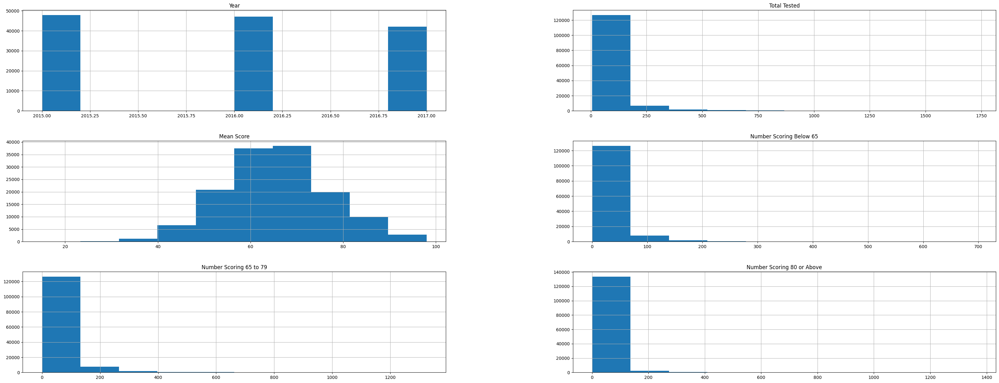

In [ ]:
df.hist()

I then did a df['Year'].min() and df['Year].max to get the beginning start year and end year of regents taken. 

Which it was from 2015 to 2016.

In [ ]:
df['Year'].min()

2015

In [ ]:
df['Year'].max()

2017

I did a df.groupby to find the sum of number scoring below 65, scoring 65 to 79, and scoring 80 or above and the average score for each Regents Exam by Year and By school. 

This gives me a more detail information of how many students scored below 65, 65 to 79, and 80 or above for each regents exam, for each year 2015 to 2017 by each school in the 5 boroughs.  

In [ ]:
pd.set_option('display.max_rows', None)
df.groupby(['School DBN', 'Year','Regents Exam']) ['Total Tested', 'Mean Score','Number Scoring Below 65', 'Number Scoring 65 to 79', 'Number Scoring 80 or Above'].sum()



<ipython-input-99-d8b13035c6bc>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['School DBN', 'Year','Regents Exam']) ['Total Tested', 'Mean Score','Number Scoring Below 65', 'Number Scoring 65 to 79', 'Number Scoring 80 or Above'].sum()


Total Tested  Mean Score  \
School DBN Year Regents Exam                                                
01M034     2015 Living Environment                         70         542   
           2016 Living Environment                         24         221   
01M140     2015 Living Environment                          9          67   
           2016 Living Environment                         25         145   
           2017 Living Environment                         33         261   
01M184     2015 Common Core Algebra                       176         391   
           2016 Common Core Algebra                       175         397   
           2017 Common Core Algebra                       181         421   
                Living Environment                        262         585   
01M188     2015 Common Core Algebra                        81         371   
           2016 Common Core Algebra                        76         343   
                Living Environment                         59         310   
           2017 Common Core Algebra                        64         339   
01M292     2015 Common Core Algebra                        26         160   
                Common Core English                       164         598   
                Common Core Geometry                       10          49   
                English                                   273         617   
                Geometry                                   36         175   
                Global History and Geography              290         532   
                Integrated Algebra                        311         701   
                Living Environment                        362         543   
                Physical Settings/Earth Science            65         267   
                U.S. History and Government               217         702   
           2016 Common Core Algebra                       247         707   
                Common Core Algebra2                       12          96   
                Common Core English                       219         661   
                English                                    58         264   
                Global History and Geography              315         593   
                Integrated Algebra                         14         102   
                Living Environment                        349         623   
                Physical Settings/Earth Science           134         306   
                U.S. History and Government               224         561   
           2017 Common Core Algebra                       256         655   
                Common Core English                       180         609   
                Common Core Geometry                       28         169   
                Global History and Geography              261         582   
                Living Environment                        301         712   
                Physical Settings/Earth Science           175         518   
                U.S. History and Government               185         562   
01M378     2015 Common Core Algebra                         6          80   
           2016 Common Core Algebra                        14         156   
           2017 Common Core Algebra                        83         518   
01M448     2015 Algebra2/Trigonometry                     170         500   
                Common Core Algebra                       495         617   
                Common Core English                       331         670   
                Common Core Geometry                      378         621   
                English                                   581         700   
                Geometry                                  433         747   
                Global History and Geography              643         718   
                Integrated Algebra                        198         656   
                Living Environment           

I did a df.groupby of total tested and total number scoring Below 65, 65 to 79, and 80 or above for each regents by year. 

I also did 2 graphs. One graphing with all 3 type of scores together and the other graph with all 3 types of scores individually in their own graph. 

I observed the following:

2015 Global History had the most students scoring below 65 with 190,173 students,
while 
Global History and Geography had the most students scoring 65 to 79 with 349,582 students
and 
U.S. History and Government had the most students scoring 80 or above with 175,769 students. 

2016 Global History and Geography had the most students scoring below 65 with 194,121 students,
while 
Common Core Algebra had the most students scoring 65 to 79 with 433,696 students 
and
Common Core English had the most students scoring 80 or above with 197,585 students. 

2017 Common Core Algebra had the most students scoring below 65 with 184,346 students.
while, 
Common Core Algebra had the most students scoring 65 to 79 with 439,759 students 
and 
Common Core English had the most students scoring 80 or above with 216,979 students.  
 

In [ ]:
df.groupby(['Regents Exam','Year'])['Total Tested', 'Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].sum()

<ipython-input-100-de3e93a0fdec>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['Regents Exam','Year'])['Total Tested', 'Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].sum()


Total Tested  Number Scoring Below 65  \
Regents Exam                    Year                                          
Algebra2/Trigonometry           2015        154550                    72747   
                                2016        148130                    76596   
                                2017         11440                     8168   
Common Core Algebra             2015        371487                   181373   
                                2016        540207                   189247   
                                2017        573065                   184346   
Common Core Algebra2            2016        115249                    43954   
                                2017        140308                    43427   
Common Core English             2015        172902                    44708   
                                2016        401403                    78275   
                                2017        448519                    95904   
Common Core Geometry            2015        180624                    91641   
                                2016        220310                   110876   
                                2017        275179                   133229   
English                         2015        361246                    85058   
                                2016         49256                    27657   
Geometry                        2015        245168                    91786   
                                2016         26694                    19493   
Global History and Geography    2015        474661                   190173   
                                2016        474164                   194121   
                                2017        446021                   181801   
Integrated Algebra              2015        286221                   115494   
                                2016         47936                    19351   
Living Environment              2015        447877                   139927   
                                2016        446284                   135403   
                                2017        456569                   154176   
Physical Settings/Chemistry     2015        134057                    48454   
                                2016        126189                    43794   
                                2017        131245                    47346   
Physical Settings/Earth Science 2015        182743                    80249   
                                2016        199178                    90678   
                                2017        199721                    96789   
Physical Settings/Physics       2015         57037                    14205   
                                2016         58814                    15633   
                                2017         61972                    14254   
U.S. History and Government     2015        382482                    89470   
                                2016        380651                    95683   
                                2017        384812                   101197   

                                      Number Scoring 65 to 79  \
Regents Exam                    Year                            
Algebra2/Trigonometry           2015                   110915   
                                2016                   110262   
                                2017                    10321   
Common Core Algebra             2015                   348085   
                                2016                   433696   
                                2017                   439759   
Common Core Algebra2            2016                    93975   
                                2017                   106202   
Common Core English             2015                   100135   
                                2016                   203818   
                                2017                   231540   
Common Core Geometry            

<ipython-input-101-c6ed5509b544>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['Regents Exam', 'Year'])['Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].sum().plot(kind='bar')


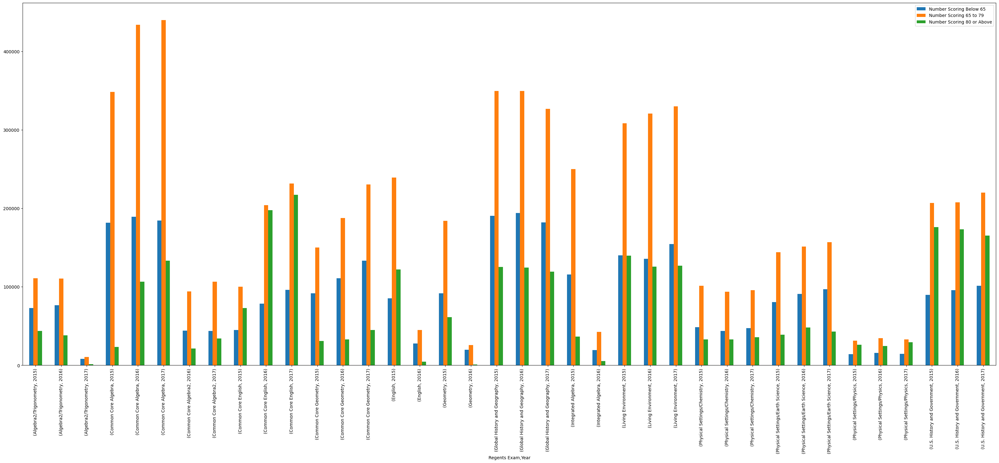

In [ ]:
df.groupby(['Regents Exam', 'Year'])['Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].sum().plot(kind='bar')
plt.rcParams["figure.figsize"] = (40,15)

<ipython-input-102-5bf6d6c87966>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['Regents Exam','Year']) ['Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].sum().plot.bar(subplots=True, figsize=(20, 15))


array([[0.84692483, 0.12648636, 0.68698762],
       [0.17975669, 0.92489079, 0.08713104],
       [0.36102821, 0.41044774, 0.95091469],
       [0.8733308 , 0.78873848, 0.01742051],
       [0.58958443, 0.37073123, 0.81423696],
       [0.52532688, 0.46779584, 0.91059154],
       [0.56452434, 0.77983797, 0.32131945],
       [0.00657464, 0.26475795, 0.84194849],
       [0.23152464, 0.11065334, 0.5337835 ],
       [0.96592755, 0.0604047 , 0.22991149],
       [0.18107016, 0.0391665 , 0.57334268],
       [0.98837891, 0.63588456, 0.59262402],
       [0.35500517, 0.13052972, 0.34191823],
       [0.72775865, 0.4641905 , 0.34427649]])

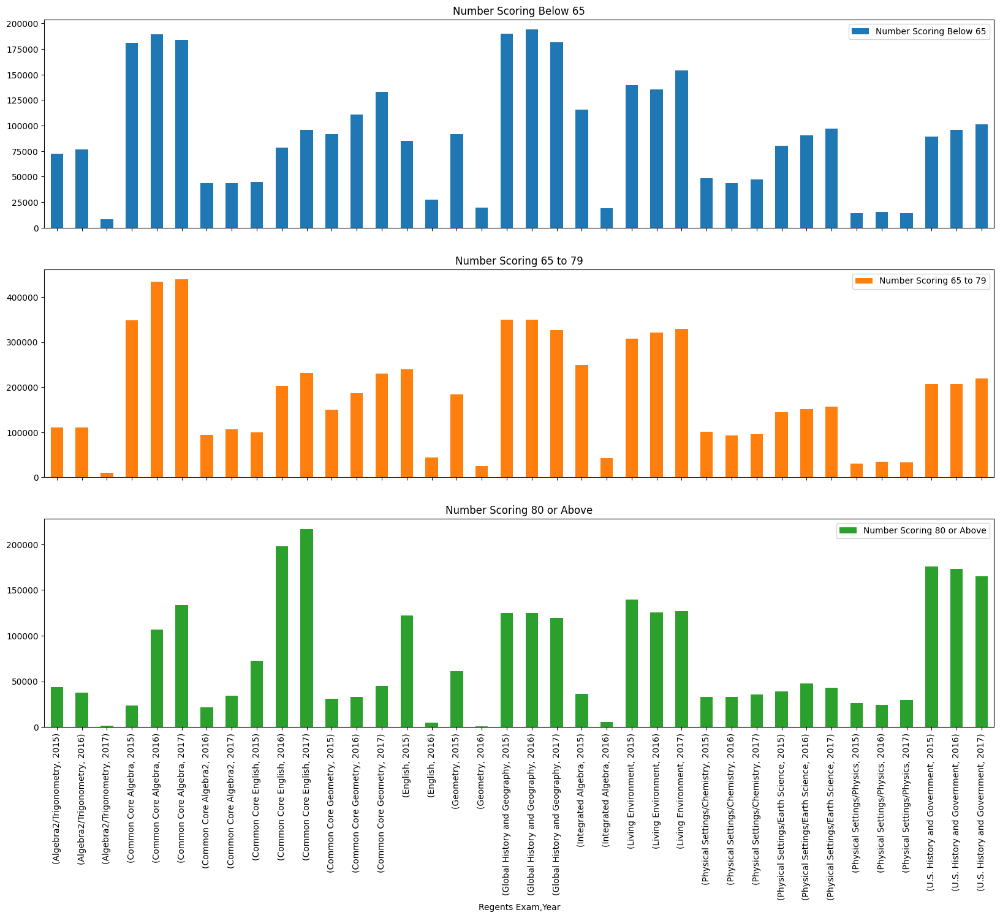

In [ ]:
df.groupby(['Regents Exam','Year']) ['Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].sum().plot.bar(subplots=True, figsize=(20, 15))
np.random.rand(14, 3) 

I did a df.groupby average of total number of student tested, number scoring below 65, 65 to 79, and 80 or above by each year 2015, 2016, and 2017.

I also did 2 graphs. One graphing with all 3 type of scores together and the other graph with all 3 types of scores individually in their own graph.

I observed the following:

From 2015 to 2017 more students have taken more Common Core Regents and Earth Science Regents and more students are passing these exams. Keep in mind to pass these exam is a requiremet to graduate with a Regents diploma. 

From 2015 to 2017 less students have taken the more Advanced Regents exams and passing them. Which means there were less students graduating with Advanced Regents Diploma. 

 
 

In [ ]:
df.groupby(['Regents Exam','Year'])['Total Tested','Number Scoring Below 65','Number Scoring 65 to 79','Number Scoring 80 or Above'].mean()

<ipython-input-103-7621dc8ca729>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['Regents Exam','Year'])['Total Tested','Number Scoring Below 65','Number Scoring 65 to 79','Number Scoring 80 or Above'].mean()


Total Tested  Number Scoring Below 65  \
Regents Exam                    Year                                          
Algebra2/Trigonometry           2015         64.61                    30.41   
                                2016         61.31                    31.70   
                                2017         18.33                    13.09   
Common Core Algebra             2015         63.29                    30.90   
                                2016         81.71                    28.63   
                                2017         81.08                    26.08   
Common Core Algebra2            2016         59.65                    22.75   
                                2017         57.84                    17.90   
Common Core English             2015         59.58                    15.41   
                                2016         79.82                    15.56   
                                2017         83.24                    17.80   
Common Core Geometry            2015         66.33                    33.65   
                                2016         67.17                    33.80   
                                2017         77.67                    37.60   
English                         2015         77.91                    18.34   
                                2016         22.94                    12.88   
Geometry                        2015         73.85                    27.65   
                                2016         25.99                    18.98   
Global History and Geography    2015         98.46                    39.45   
                                2016         95.89                    39.26   
                                2017         90.16                    36.75   
Integrated Algebra              2015         67.79                    27.36   
                                2016         22.98                     9.28   
Living Environment              2015         76.21                    23.81   
                                2016         74.29                    22.54   
                                2017         71.80                    24.25   
Physical Settings/Chemistry     2015         63.78                    23.05   
                                2016         60.18                    20.88   
                                2017         60.73                    21.91   
Physical Settings/Earth Science 2015         54.58                    23.97   
                                2016         56.79                    25.86   
                                2017         56.39                    27.33   
Physical Settings/Physics       2015         58.26                    14.51   
                                2016         58.35                    15.51   
                                2017         61.60                    14.17   
U.S. History and Government     2015         80.86                    18.92   
                                2016         76.56                    19.24   
                                2017         76.20                    20.04   

                                      Number Scoring 65 to 79  \
Regents Exam                    Year                            
Algebra2/Trigonometry           2015                    46.37   
                                2016                    45.64   
                                2017                    16.54   
Common Core Algebra             2015                    59.30   
                                2016                    65.60   
                                2017                    62.22   
Common Core Algebra2            2016                    48.64   
                                2017                    43.78   
Common Core English             2015                    34.51   
                                2016                    40.53   
                                2017                    42.97   
Common Core Geometry            

<ipython-input-104-ac0653d774b1>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['Regents Exam','Year',])['Number Scoring Below 65','Number Scoring 65 to 79','Number Scoring 80 or Above'].mean().plot.bar()


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37]),
 [Text(0, 0, '(Algebra2/Trigonometry, 2015)'),
  Text(1, 0, '(Algebra2/Trigonometry, 2016)'),
  Text(2, 0, '(Algebra2/Trigonometry, 2017)'),
  Text(3, 0, '(Common Core Algebra, 2015)'),
  Text(4, 0, '(Common Core Algebra, 2016)'),
  Text(5, 0, '(Common Core Algebra, 2017)'),
  Text(6, 0, '(Common Core Algebra2, 2016)'),
  Text(7, 0, '(Common Core Algebra2, 2017)'),
  Text(8, 0, '(Common Core English, 2015)'),
  Text(9, 0, '(Common Core English, 2016)'),
  Text(10, 0, '(Common Core English, 2017)'),
  Text(11, 0, '(Common Core Geometry, 2015)'),
  Text(12, 0, '(Common Core Geometry, 2016)'),
  Text(13, 0, '(Common Core Geometry, 2017)'),
  Text(14, 0, '(English, 2015)'),
  Text(15, 0, '(English, 2016)'),
  Text(16, 0, '(Geometry, 2015)'),
  Text(17, 0, '(Geometry, 2016)'),
  Text(18, 0, '(Global History and Geog

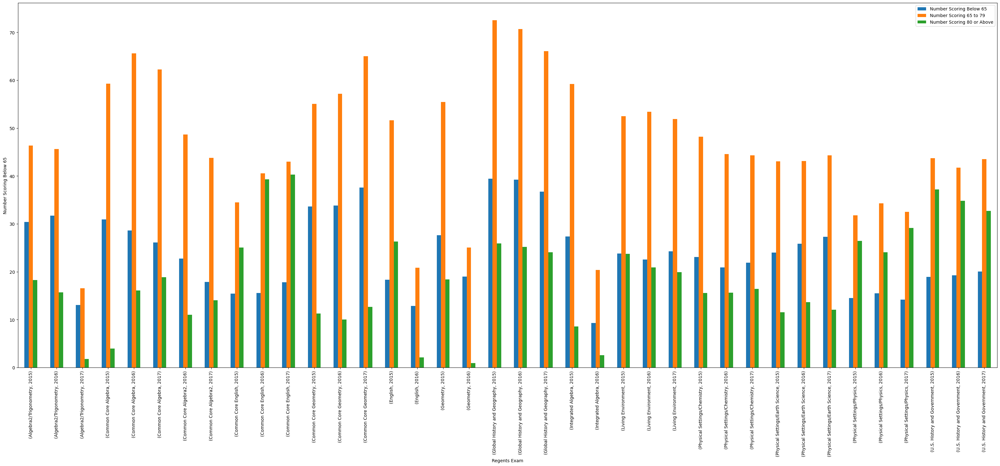

In [ ]:
df.groupby(['Regents Exam','Year',])['Number Scoring Below 65','Number Scoring 65 to 79','Number Scoring 80 or Above'].mean().plot.bar()
plt.xlabel('Regents Exam')
plt.ylabel('Number Scoring Below 65')
plt.xticks(rotation=90)


<ipython-input-105-7b1299e06cd7>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['Year', 'Regents Exam'])['Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].mean().plot.bar(subplots=True, figsize=(20, 15))


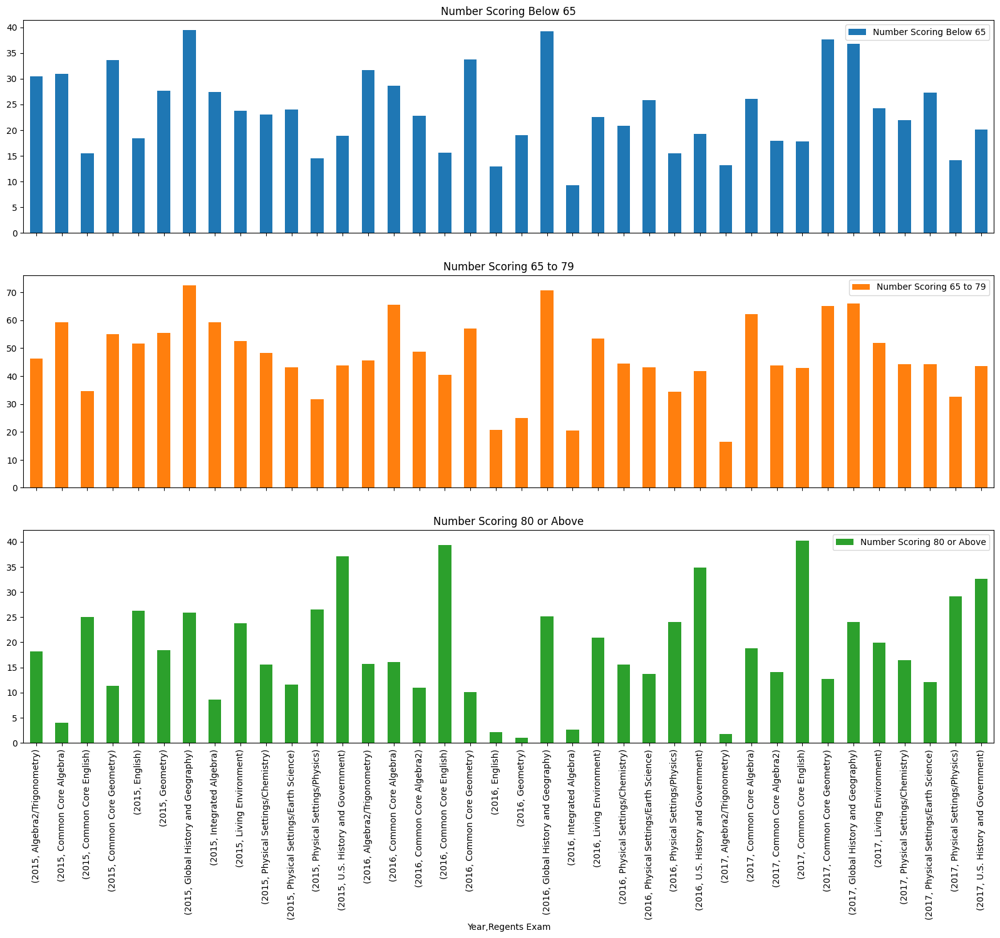

In [ ]:
df.groupby(['Year', 'Regents Exam'])['Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].mean().plot.bar(subplots=True, figsize=(20, 15))
np.random.rand(14, 3) 

columns = ["Number Scoring Below 65","Number Scoring 65 to 79", "Number Scoring 80 or Above"]

I did a df.groupby of total number of student tested, number scoring below 65, 65 to 79, and 80 or above by each year 2015, 2016, and 2017.

I observed that all 3 years students scored 65 to 79. 

Even though most students scored 65 to 79, I notice each year students scoring 65 to 79 dropped approximately 224,000 in 2016 and approximately 119,000 in 2017 and the scoring for 80 or above had increased by approximately 10,000 each year and scoring below 65 had decreased approximately 100,000 each year. But also keep in mind that total tested dropped approximately give or take 150,000 each year. 

I also did a graphing. 


In [ ]:
df.groupby(['Year'])['Total Tested', 'Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].sum()

<ipython-input-106-7f30c30d8842>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['Year'])['Total Tested', 'Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].sum()


,Total Tested,Number Scoring Below 65,Number Scoring 65 to 79,Number Scoring 80 or Above
Year,,,,
2015,3451055,1245285,2523424,927631
2016,3234465,1140761,2299331,935134
2017,3128851,1060637,2179999,948852


<ipython-input-107-cb888408f933>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['Year'])['Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].sum().plot(kind='bar')


<Axes: xlabel='Year'>

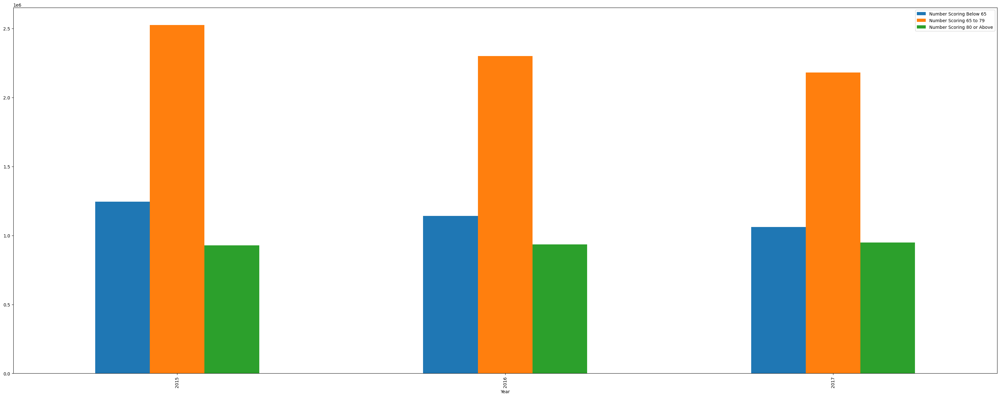

In [ ]:
df.groupby(['Year'])['Number Scoring Below 65', 'Number Scoring 65 to 79','Number Scoring 80 or Above'].sum().plot(kind='bar')

I did a sns.barplot. Again, showing a comparison with the average regents scores for each regents by year. U.S. History and Government has the highest average of 75 in 2015, which then dropped to 70 by 2017. The lowest is Algebra 2/Trigonometry with 53 in 2017, which was 57 in 2015.

<Axes: xlabel='Mean Score', ylabel='Regents Exam'>

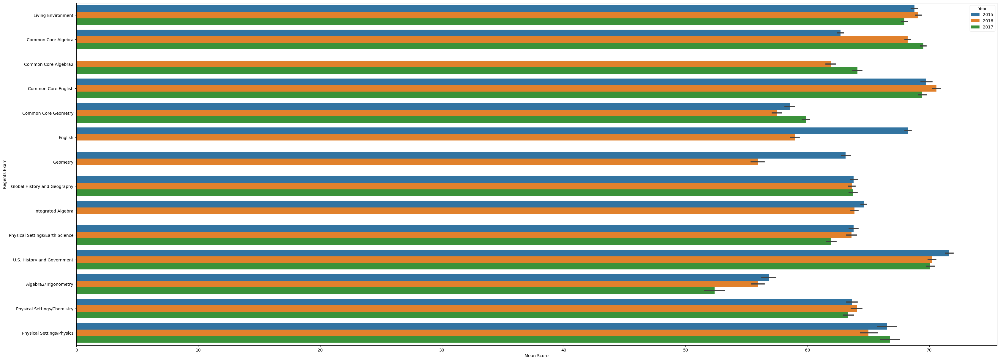

In [ ]:
sns.barplot(x='Mean Score', y='Regents Exam', data=df, hue='Year')

I did a sns.boxplot showing a comparison with the average regents scores for each regents. Common Core English and US History and Government has the highest average and the lowest is Algebra 2/Trigonometry.



<Axes: xlabel='Regents Exam', ylabel='Mean Score'>

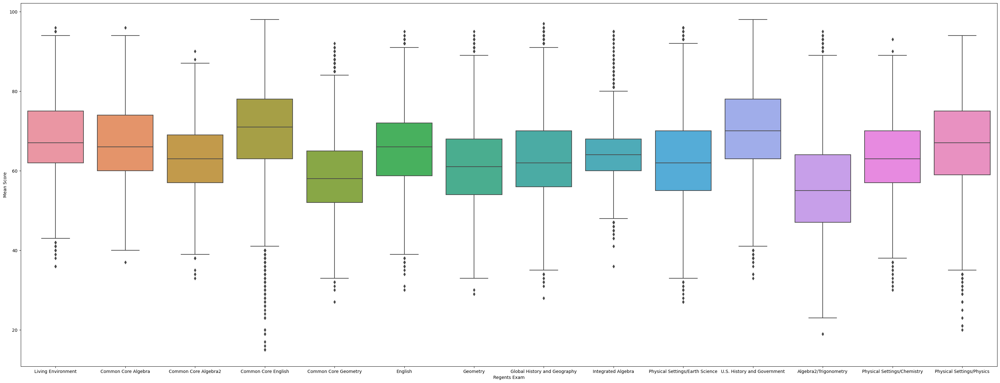

In [ ]:
sns.boxplot(x='Regents Exam', y='Mean Score', data=df)

I did a displot graphing of "mean score". 

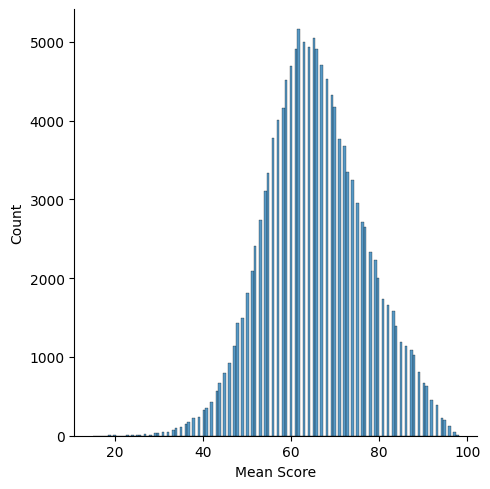

In [ ]:
sns.displot(df['Mean Score']) 

**I** did a sns.jointplot graph just to compare the mean score with each regent exam. 

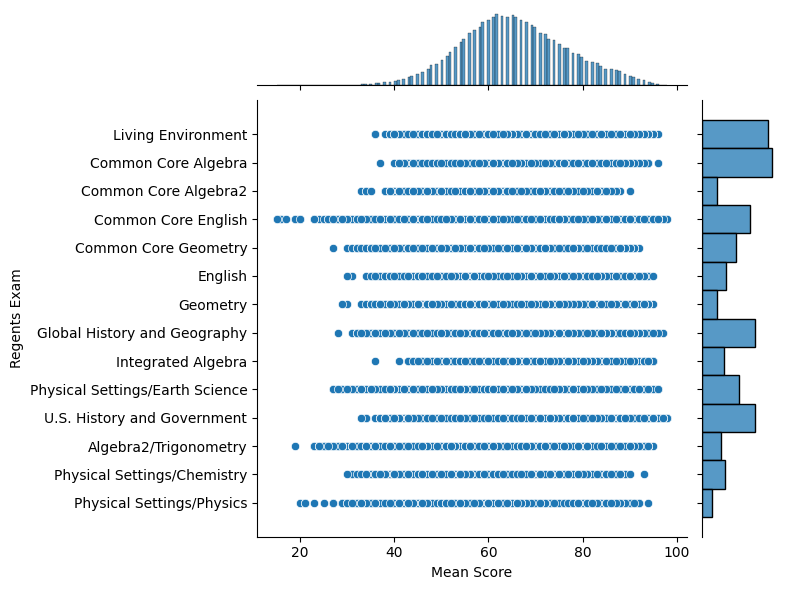

In [ ]:
sns.jointplot(x='Mean Score', y='Regents Exam', data = df)

Conclusion

Results of the Regents Exams are used not only for student high school graduation requirements, but for school quality reports, and teacher development and evaluation. Based on the regents results in 2015 to 2017 I observe by looking at the numbers and graphing teachers have been concentrating in getting the students prepared for the basics, like Common Core Algebra, Common Core English, Living Environment, U.S. History and Government, and Global History and Geography, so they could earn their required Regents Diploma as long as they got a 65+.  Advanced regents were left as an optional for those students that wanted to earn an Advanced Regents Diploma. 